# Estimate responses from abrupt CO2 change experiments, with oscillation on slowest mode

## Update: An oscillation on the decadal-scale mode has a better physical reason, so these results will probably not be used

## Also: This file should be updated to use the functions defined in "my_functions"

In [20]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import os
from scipy import optimize
from lmfit import Model
import matplotlib.gridspec as gridspec
plt.rcParams.update({'figure.max_open_warning': 0})

exp = 'abrupt-4xCO2'

# define response functions
def osc_parts(t, S3, S4, p, q):
    taup = -1/p
    osc_part1 = S3*(1 - np.exp(-t/taup)*(np.cos(q*t) + p/q*np.sin(q*t)))
    osc_part2 = S4*(1 - np.exp(-t/taup)*(np.cos(q*t) - q/p*np.sin(q*t)))
    return osc_part1 + osc_part2
def exp_part1(t, S1, tau1):
    return S1*(1 - np.exp(-t/tau1))
def exp_part2(t, S2, tau2):
    return S2*(1 - np.exp(-t/tau2))

def osc_response_model(t, S1, S2, S3, S4, tau1, tau2, p, q):
    return osc_parts(t, S3, S4, p, q) + exp_part1(t, S1, tau1) + exp_part2(t, S2, tau2)

# create models for total response and the components
gmodel = Model(osc_response_model)
oscmodel = Model(osc_parts); expmodel1 = Model(exp_part1); expmodel2 = Model(exp_part2)

# make functions and models for the TOA imbalance components
def oscN_parts(t, S3, S4, p, q):
    taup = -1/p
    osc_part1 = - S3*np.exp(-t/taup)*(np.cos(q*t) + p/q*np.sin(q*t))
    osc_part2 = - S4*np.exp(-t/taup)*(np.cos(q*t) - q/p*np.sin(q*t))
    return osc_part1 + osc_part2
def expN_part1(t, S1, tau1):
    return -S1*np.exp(-t/tau1)
def expN_part2(t, S2, tau2):
    return -S2*np.exp(-t/tau2)

oscNmodel = Model(oscN_parts); expNmodel1 = Model(expN_part1); expNmodel2 = Model(expN_part2)

In [21]:
#model = 'ACCESS-CM2'; member = 'r1i1p1f1'
#model = 'CESM2'; member = 'r1i1p1f1'
#model = 'GISS-E2-1-G'; member = 'r1i1p1f1'
#model = 'TaiESM1'; member = 'r1i1p1f1'

In [22]:
model_anom_names = [ f.name for f in os.scandir('../Processed_data/Global_annual_anomalies/') if f.is_dir() and f.name !='.ipynb_checkpoints']
model_anom_names.sort()

member_dict = {}
for model in model_anom_names:
    anom_exp = [ f.name for f in os.scandir('../Processed_data/Global_annual_anomalies/' + model) if f.is_dir() and f.name !='.ipynb_checkpoints']
    if exp in anom_exp: # which members do we have?
        filenames = [ f.name for f in os.scandir('../Processed_data/Global_annual_anomalies/' + model + '/' + exp) if f.name !='.ipynb_checkpoints']
        members = [file.rsplit('_')[2] for file in filenames]
        members.sort()
        member_dict[model] = members


In [23]:
member_dict;

## Estimate responses

ACCESS-CM2 slope =  0.032388210263111956
ACCESS-ESM1-5 slope =  0.020568226327852462
AWI-CM-1-1-MR slope =  0.013632353796065418
BCC-CSM2-MR slope =  0.014440632266024265
BCC-ESM1 slope =  0.01563946881088858
CAMS-CSM1-0 slope =  0.008888651226834843
-0.009357420403084949
CAMS-CSM1-0 slope =  0.0095694501462548
-0.011337854115682828
CAS-ESM2-0 slope =  0.01712634222339764
CESM2 slope =  0.025348259901536455
CESM2-FV2 slope =  0.01643327921107335
CESM2-WACCM slope =  0.019237165252514583
CESM2-WACCM-FV2 slope =  0.018892098396756218
CIESM slope =  0.03371567096248684
CMCC-CM2-SR5 slope =  0.020364493130227285
CNRM-CM6-1 slope =  0.02348674161833699
CNRM-CM6-1-HR slope =  0.022112137388665017
CNRM-ESM2-1 slope =  0.016293949172035496
CNRM-ESM2-1 slope =  0.02213501936476099
CNRM-ESM2-1 slope =  0.02681426447589161
CanESM5 slope =  0.03231240688802251
CanESM5 slope =  0.0326717809671057
E3SM-1-0 slope =  0.03361306000032428
EC-Earth3 slope =  0.035739010452836804
EC-Earth3 slope =  0.0306

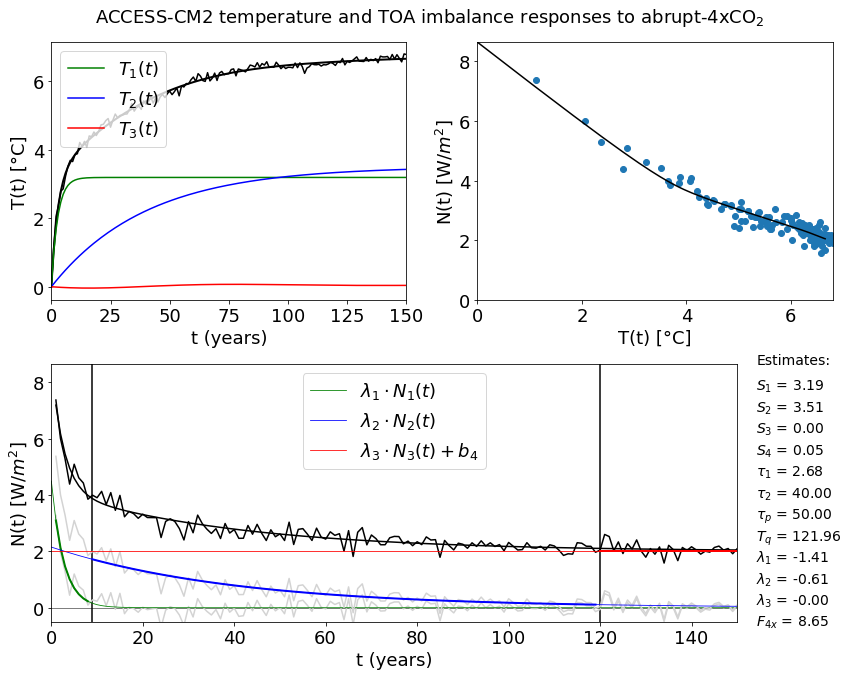

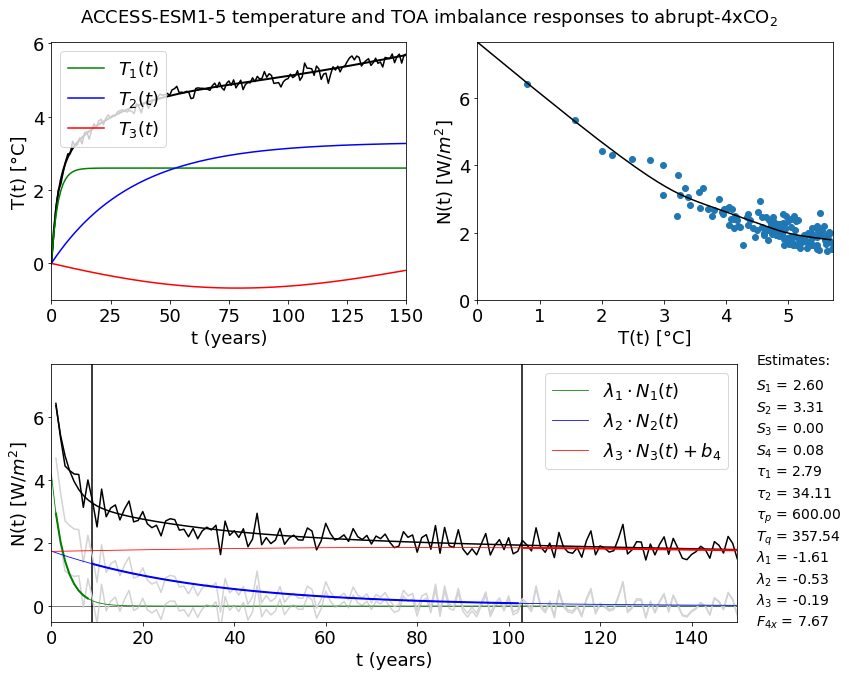

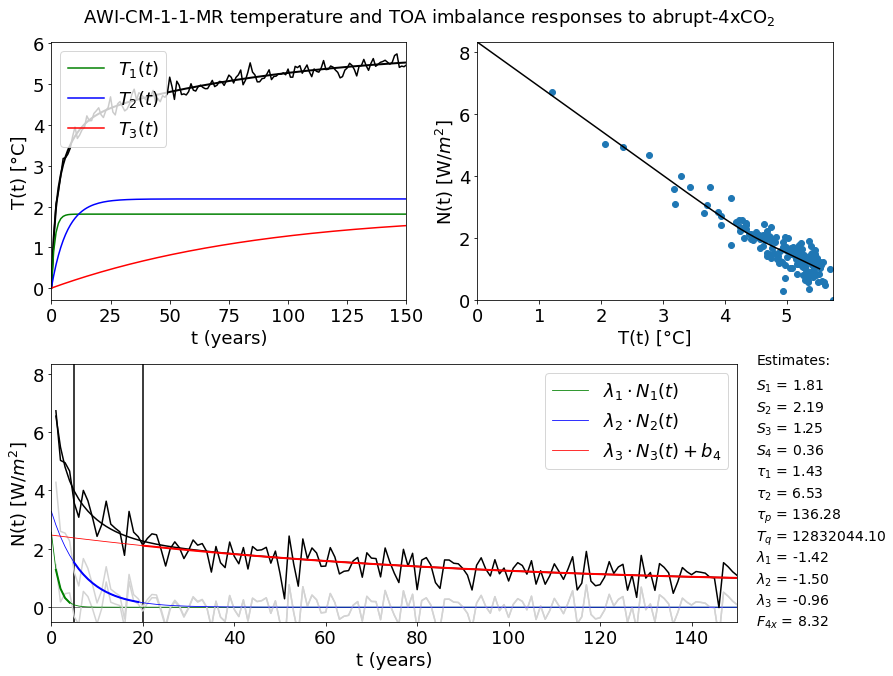

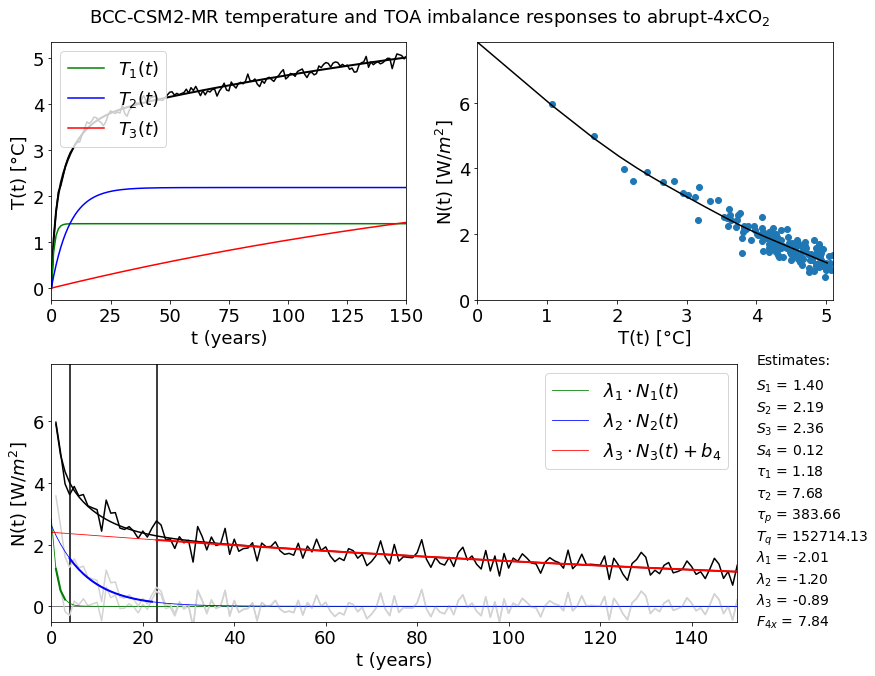

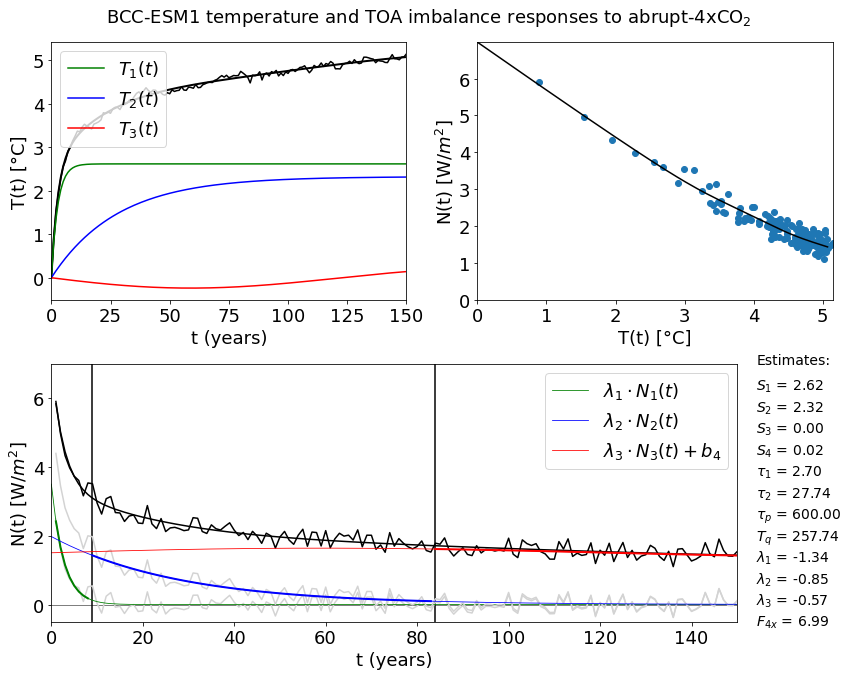

...

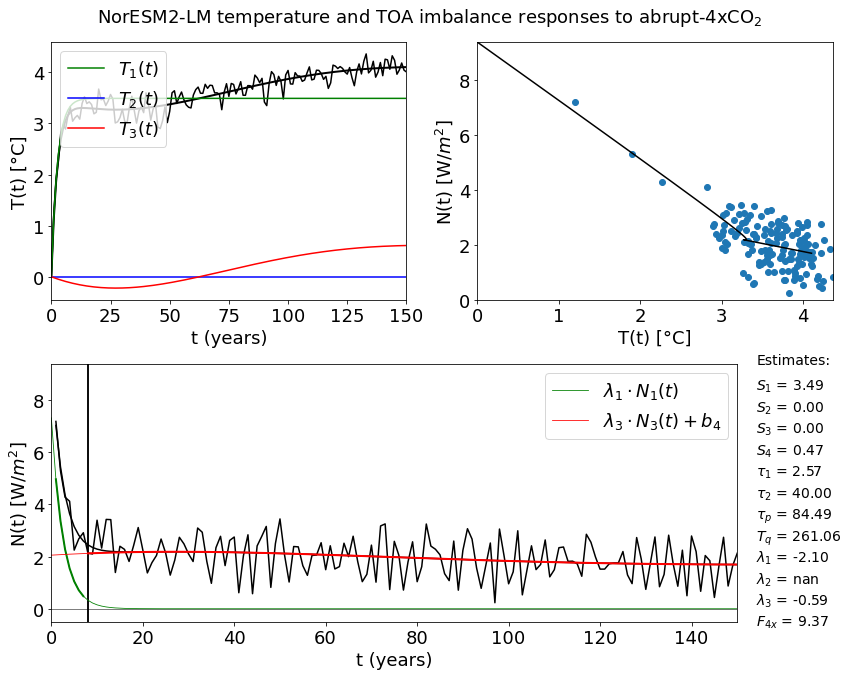

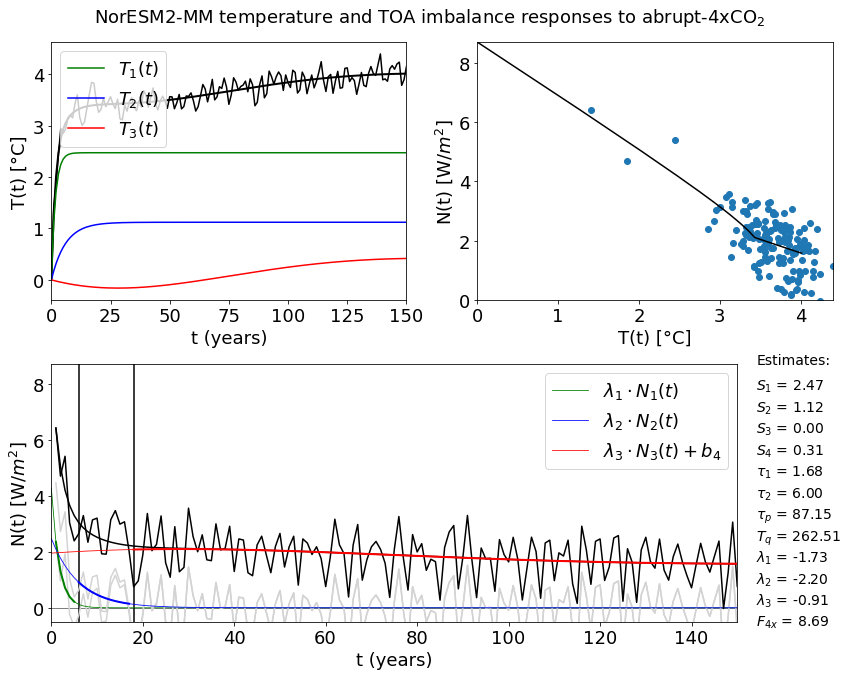

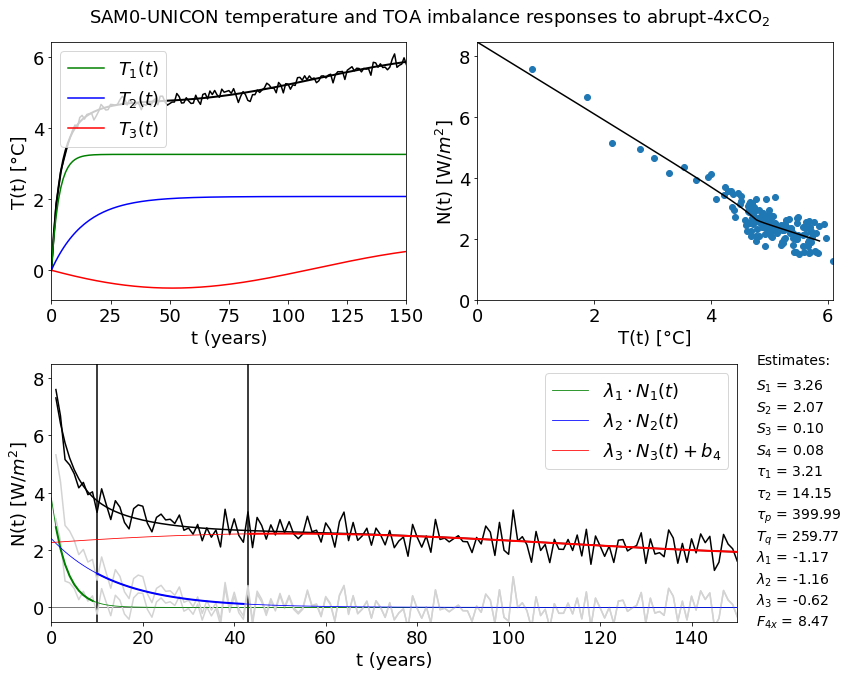

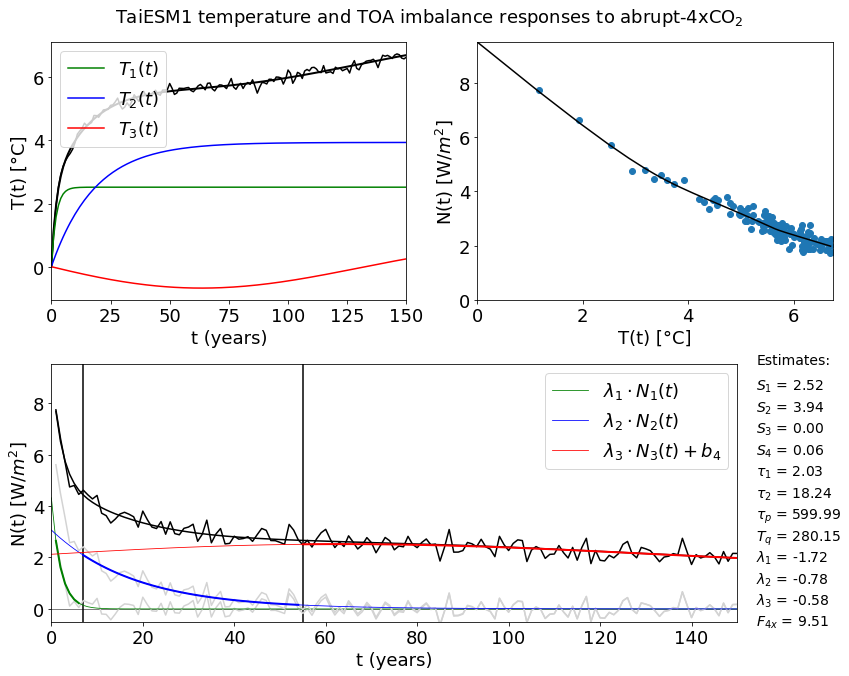

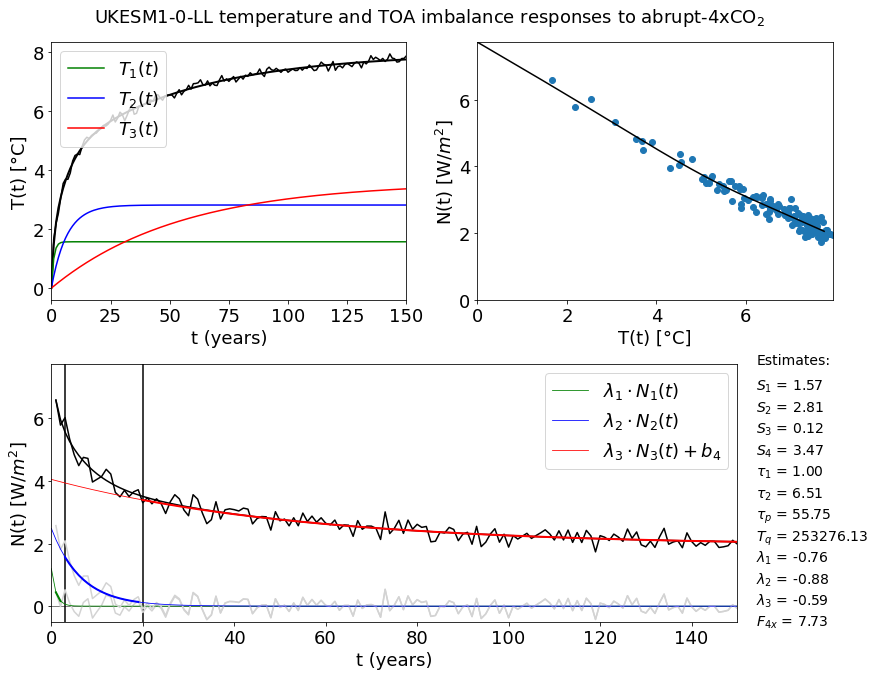

In [37]:
for model in member_dict:
#for model in ['ACCESS-CM2']:
    for member in member_dict[model]:

        # load data
        filename = model + '_' + exp + '_' + member + '_anomalies.txt'
        file = os.path.join('../Processed_data/Global_annual_anomalies/', model, exp, filename)

        data = pd.read_table(file, index_col=0, sep = ',')
        data = data.dropna().reset_index()

        if exp == 'abrupt-2xCO2': # "convert to 4xCO2" by multiplying by 2
            data *= 2
        elif exp == 'abrupt-0p5xCO2': # "convert to 4xCO2" by multiplying by -2
            data *= -2
        x = data.index.values;

        deltaN = data['rsdt'] - data['rsut'] - data['rlut']
        deltaT = data['tas']
        if len(deltaT)<150:
            continue

        deltaT = deltaT[:150]; deltaN = deltaN[:150] # if data is longer than 150 years, use only the first 150 years
        years = np.arange(1,150+1)
        p_lim = 1 - 0.95;

        parameters_names = ['p', 'q', 'tau3', 'tau4', 'a_1', 'a_2', 'a_3', 'a_4', 'b_1', 'b_2', 'b_3', 'b_4', 'F2x', 'T2x','rnorm']
        df_par = pd.DataFrame(columns=parameters_names)

        # for deltaT we also have the information that deltaT(0) = 0. Include this:
        deltaT0 = np.concatenate(([0],deltaT))
        years0 = np.concatenate(([0],years))

        # set initial and boundary values
        gmodel.set_param_hint('S1', value=deltaT0[20]+0.5, min=0, max=10.0)
        gmodel.set_param_hint('S2', value=0.5, min=0, max=5)
        gmodel.set_param_hint('S3', value=1, min=0, max=6.0)
        gmodel.set_param_hint('S4', value=0.2, min=0, max=6.0)
        gmodel.set_param_hint('tau1', value=4, min=1, max=6)
        gmodel.set_param_hint('tau2', value=15, min=6, max=40)

        # result is sensitive to initial guess of q, so we need a good guess that may be different for different models
        slope_period = np.arange(19,69)
        tempslope = np.polyfit(slope_period,deltaT0[slope_period],1)[0]
        print(model, 'slope = ', tempslope)
        if abs(tempslope)<0.01: # need to further test the criteria
            slope1 = np.polyfit(slope_period[:25],deltaT0[slope_period][:25],1)[0]
            slope2 = np.polyfit(slope_period[25:],deltaT0[slope_period][25:],1)[0]
            print(slope2-slope1)
            if slope2-slope1 > 0.01:
                gmodel.set_param_hint('q', value=2*np.pi*tempslope, min=0, max=2*np.pi/40)
                gmodel.set_param_hint('p', value=-1/100, min=-1/50, max=-1/400)
            else:
                gmodel.set_param_hint('q', value=2*np.pi/200, min=0, max=2*np.pi/40)
                gmodel.set_param_hint('p', value=-1/200, min=-1/50, max=-1/400)
        else: # less likely to have an oscillation. Guess a long period, which is an approximation of not having an oscillation.
            #gmodel.set_param_hint('q', value=2*np.pi/150, min=0, max=2*np.pi/40)
            gmodel.set_param_hint('q', value=2*np.pi/1000, min=0, max=2*np.pi/40)
            gmodel.set_param_hint('p', value=-1/100, min=-1/50, max=-1/600)

            
        
        result = gmodel.fit(deltaT0, t=years0, method = 'leastsq')
        #print(result.fit_report())
        Tosc = oscmodel.eval(result.params, t=years0); Texp1 = expmodel1.eval(result.params, t=years0); Texp2 = expmodel2.eval(result.params, t=years0)

        tau_1 = result.best_values['tau1']; tau_2 = result.best_values['tau2']; tau_p = -1/result.best_values['p']; T_q = 2*np.pi/result.best_values['q']
        S_1 = result.best_values['S1']; S_2 = result.best_values['S2']; S_3 = result.best_values['S3']; S_4 = result.best_values['S4'];

        p_lim = 1 - 0.95; 
        timesplit2 = np.int(np.ceil(-tau_2*np.log(p_lim))) # time measured in years
        timesplit1 = np.int(np.ceil(-tau_1*np.log(p_lim)))
                    

        
        ### Estimate TOA imbalance response ###

        # model evaluated with and without year 0 
        oscN_0 = oscNmodel.eval(result.params, t=years0); oscN = oscNmodel.eval(result.params, t=years);
        expN1_0 = expNmodel1.eval(result.params, t=years0); expN1 = expNmodel1.eval(result.params, t=years);
        expN2_0 = expNmodel2.eval(result.params, t=years0); expN2 = expNmodel2.eval(result.params, t=years)
        
        def TOAimb_model(expN1_eval, expN2_eval, oscN_eval, fbpar1, fbpar2, fbpar3, b_4):
            return fbpar1*expN1_eval + fbpar2*expN2_eval + fbpar3*oscN_eval + b_4
        
        Nmodel = Model(TOAimb_model, independent_vars=['expN1_eval', 'expN2_eval', 'oscN_eval']);
        
        Nmodel.set_param_hint('fbpar1', value=-1, min=-5, max = 0)
        Nmodel.set_param_hint('fbpar2', value=-1, min=-5, max = 0)
        Nmodel.set_param_hint('fbpar3', value=-1, min=-5, max = 0)
        Nmodel.set_param_hint('b_4', value=2, min=0, max = 10)
        
        Nresult = Nmodel.fit(data = deltaN, expN1_eval = expN1, expN2_eval = expN2, oscN_eval = oscN)
        
        fbp1 = Nresult.best_values['fbpar1']; fbp2 = Nresult.best_values['fbpar2']; fbp3 = Nresult.best_values['fbpar3']; b4 = Nresult.best_values['b_4'];
        
        f4x = b4 + fbp3*oscN_0[0] + fbp2*expN2_0[0] + fbp1*expN1_0[0]
        #print('Estimated 4xCO2 forcing is', f4x)

        Nmodel_result = Nresult.best_fit
        
        #Nmodel = b4 + fbp3*oscN_0 + fbp2*expN2_0 + fbp1*expN1_0
        
        if S_2 < 0.01: # intermediate mode is basically nonexisting, and should be omitted
            timesplit2 = timesplit1
            timeindrange1 = np.arange(timesplit1-1)
            fbp2 = np.nan
        elif S_1 < 0.01: # fastest mode is basically nonexisting, and should be omitted
            timesplit1 = timesplit2 # used only for plotting
            timeindrange2 = np.arange(timesplit2-1)
            fbp1 = np.nan
        else: # all modes exist
            timeindrange2 = np.arange(timesplit1-1, timesplit2-1)
            timeindrange1 = np.arange(timesplit1-1)
        timeindrange3 = np.arange(timesplit2-1, years[-1]) # time index, where index 0 is year 1. Hence we need to subtract 1 from the year   

        
        

        ############  Plotting: ############
        fig = plt.figure(figsize = [14,10]);
        
        outer = gridspec.GridSpec(2, 1, height_ratios = [1, 1],  hspace = 0.25) #make outer gridspec
        #make nested gridspecs
        gs1 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec = outer[0], hspace = 0.1)
        gs2 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec = outer[1], wspace = 0.05, width_ratios = [0.9, 0.1])

        Tax = fig.add_subplot(gs1[0]); Gax = fig.add_subplot(gs1[1]); Nax = fig.add_subplot(gs2[0]); textax = fig.add_subplot(gs2[1]);
        allfig_axes = [Tax, Gax, Nax]
        fig.suptitle(model + ' temperature and TOA imbalance responses to abrupt-4xCO$_2$',fontsize = 18)
        plt.subplots_adjust(top=0.93)

        for axes in allfig_axes:
            axes.tick_params(axis='both',labelsize=18)

        # temperature plot
        Tax.set_xlabel('t (years)',fontsize = 18)
        Tax.set_ylabel('T(t) [°C]',fontsize = 18)
        Tax.set_xlim(min(years0),max(years0))
        Tax.plot(years0, result.best_fit, '-', color = 'black', linewidth = 2)
        Tax.plot(years0, deltaT0, color = 'black')
        Tax.plot(years0, Texp1, color = 'green', label = '$T_1(t)$'); Tax.plot(years0, Texp2, color = 'blue', label = '$T_2(t)$'); Tax.plot(years0, Tosc, color = 'red', label = '$T_3(t)$')
        Tax.legend(fontsize = 18, loc = 'upper left')

        # Gregory plot
        Gax.scatter(deltaT,deltaN)
        Gax.plot(result.best_fit, np.concatenate([[f4x], Nmodel_result]), color = 'black')
        Gax.set_xlabel('T(t) [°C]',fontsize = 18)
        Gax.set_ylabel('N(t) [W/$m^2$]',fontsize = 18)
        Gax.set_xlim(0, np.max([np.max(deltaT), np.max(result.best_fit)]))
        Gax.set_ylim(0, np.max([deltaN[0], f4x]))

        # TOA imbalance plot
        Nax.set_xlabel('t (years)',fontsize = 18)
        Nax.set_ylabel('N(t) [W/$m^2$]',fontsize = 18)
        Nax.axhline(0, color='k', linewidth = 0.5) # horizontal lines

        Nax.set_xlim(0,years[-1])
        Nax.axvline(x=timesplit2, color = 'black'); Nax.axvline(x=timesplit1, color = 'black')
        
        if S_1>0.01: 
            dN1 = deltaN - fbp3*oscN - b4 - fbp2*expN2
            Nax.plot(years, dN1, color = 'lightgray'); #Nax.plot(years[timeindrange1], dN1[timeindrange1], color = 'black')
            Nax.plot(years0, fbp1*expN1_0, color = 'green', linewidth = 0.8, label = '$\lambda_1 \cdot N_1(t)$'); Nax.plot(years0[timeindrange1+1], fbp1*expN1_0[timeindrange1+1], color = 'green', linewidth = 2)
        
        if S_2>0.01:
            dN = deltaN - fbp3*oscN - b4
            Nax.plot(years, dN, color = 'lightgray'); #Nax.plot(years[timeindrange2], dN[timeindrange2], color = 'black')
            Nax.plot(years0, fbp2*expN2_0, color = 'blue', linewidth = 0.8, label = '$\lambda_2 \cdot N_2(t)$'); Nax.plot(years0[timeindrange2+1], fbp2*expN2_0[timeindrange2+1], color = 'blue', linewidth = 2)
        Nax.plot(years, deltaN, color = 'black'); #Nax.plot(years[timeindrange3], deltaN[timeindrange3], color = 'black')
        Nax.plot(years, Nmodel_result, color = 'black')
        Nax.plot(years0, b4 + fbp3*oscN_0, color = 'red', linewidth = 0.8, label = '$\lambda_3 \cdot N_3(t) + b_4$'); Nax.plot(years0[timeindrange3+1], b4 + fbp3*oscN_0[timeindrange3+1], color = 'red', linewidth = 2); 
        Nax.set_ylim(-0.5,np.max([deltaN[0], f4x]))
        #print(np.max([deltaN[0], f4x]), deltaN[0])
        Nax.legend(fontsize = 18)

        # print out estimates in the last "plot"
        textax.axis('off');
        esttoshow = [S_1, S_2, S_3, S_4, tau_1, tau_2, tau_p, T_q, fbp1, fbp2, fbp3, f4x]
        textlabels = ['$S_1$', '$S_2$', '$S_3$', '$S_4$', r'$\tau_1$', r'$\tau_2$', r'$\tau_p$', '$T_q$', '$\lambda_1$', '$\lambda_2$', '$\lambda_3$', '$F_{4x}$']
        textax.text(0,1, 'Estimates:', fontsize=14)
        for (ind, estimate) in enumerate(esttoshow):
            textax.text(0,0.9-ind/len(esttoshow),textlabels[ind] + ' = ' + str('{:.2f}'.format(np.round(estimate,2))), fontsize=14)

        ### NB: result will depend on initial guess of variable, important for period of oscillation
        ### we may want to automatically make a good guess of the period, perhaps based on the slope of years 20-70?


        #plt.savefig('../Figures/' + model + '_' + member + '_oscandexp_responses.pdf', format='pdf', dpi=600, bbox_inches="tight")
        
        # parameters to be saved:
        #tau1 tau2	tau3	tau4	a_1	a_2	a_3	a_4	b_1	b_2	b_3	b_4	F2x	T2x	GregoryF2x	GregoryT2x
        
        # compute also parameters using ordinary Gregory method:
        p1 = np.polyfit(deltaT,deltaN,deg = 1)
        #deltaTextended = np.concatenate(([0],deltaT,[-p1[1]/p1[0]]))
        #linfit = np.polyval(p1,deltaTextended)
        GregoryF2x = p1[1]/2; GregoryT2x = -p1[1]/(2*p1[0])
        
        columnnames = ['member', 'tau1', 'tau2', 'tau_p', 'T_q', 'S_1', 'S_2', 'S_3', 'S_4', 'b_1', 'b_2', 'b_3', 'b_4', 'F2x','GregoryF2x','GregoryT2x'];
        pars = np.concatenate((member, tau_1, tau_2, tau_p, T_q, S_1, S_2, S_3, S_4, -S_1*fbp1, - S_2*fbp2,  - (S_3 + S_4)*fbp3, b4, f4x/2, GregoryF2x, GregoryT2x), axis=None)
        dataframe = pd.DataFrame([pars], index = [model], columns=columnnames)

        # if file is not already created, create a new file to store the results in:
        filename = 'best_estimated_osc_parameters.txt'
        if os.path.isfile('../Estimates/' + filename) == False:
            dataframe.to_csv('../Estimates/' + filename, sep='\t')
        else: # if file exists already, load instead exising file and append results: 
            loaded_dataframe = pd.read_table('../Estimates/' + filename,index_col=0)
            #if (loaded_dataframe.index == model).any():
                #loaded_dataframe = loaded_dataframe.drop([model]) # if model already has a row that I want to remove
            loaded_dataframe = loaded_dataframe.append(dataframe)

            # write them to a file:
            #if exp == 'abrupt-4xCO2' and member in ['r1i1p1f1', 'r1i1p1f2']: # keep only first member of 4xCO2 right now
            loaded_dataframe.to_csv('../Estimates/' + filename, sep='\t')

  



In [ ]:
# will it be better to run the code again without the oscillation when T_q is above a limit and we don't expect there to be an oscillation present?
# Try for UKESM. Its amplitude becomes too strong for the longest mode


# Perhaps merge modes that have a strong correlation or anticorrelation, before estimating the feedback parameters?
# - Merges modes with too similar time scales
# - Merges modes with opposite signs of the response that counteract eachother.


# Possible selection criterion for using oscillatory response:
# - Make a smooth temperature time series (moving average), 
#   and check if its derivative is monotonically decreasing
# lmfit with 3 exponentials where response is monotonically decreasing
# lmfit with 2 shorter exp and 1 pair of oscillatory resp. otherwise
